/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


([], [])

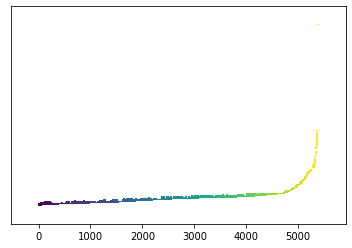

In [8]:
from matplotlib.lines import Line2D # Imported for legends
import matplotlib.collections as mc
import matplotlib.pyplot as plt
import numpy as np
start_end_df = df[["Start", "End", "Protein Accession"]]
start_end_df.sort_values('Start', inplace=True)
intervals = [tuple(x) for x in start_end_df.values]

num_intervals = len(intervals)
viridis = plt.cm.get_cmap('viridis', num_intervals)
colors = np.array([viridis(idx / num_intervals) for idx in range(len(intervals))])

# Prepare the input data in correct format for LineCollection 
lines = []
counter = 0
for i, j, k in intervals:
    lines.append([(counter, i), ( counter,j )])
    counter += 1

lc = mc.LineCollection(lines, colors= colors, linewidths=2)
fig, ax = plt.subplots()
ax.add_collection(lc)
ax.margins(0.1)
plt.yticks([], [])

# # Adding the legends
# def make_proxy(col, scalar_mappable, **kwargs):
#     color = col 
#     return Line2D([0, 1], [0, 1], color=color, **kwargs)
# proxies = [make_proxy(c, lc, linewidth=2) for c in colors]
# ax.legend(proxies, range(5))

# # Adding annotations
# for i, x in enumerate(intervals):
#     plt.text(x[0], i+0.1, x[0], color=colors[i])
#     plt.text(x[1], i+0.1, x[1], color=colors[i])

In [5]:
pp = df[["Start", "End"]]
# get data frame min and max values
print(pp.describe())

             Start          End
count  5377.000000  5377.000000
mean    141.076995   162.466059
std     156.022484   154.747543
min       1.000000     8.000000
25%      52.000000    74.000000
50%     118.000000   132.000000
75%     154.000000   184.000000
max    3183.000000  3196.000000


<class 'pandas.core.series.Series'>


<Figure size 1440x720 with 0 Axes>

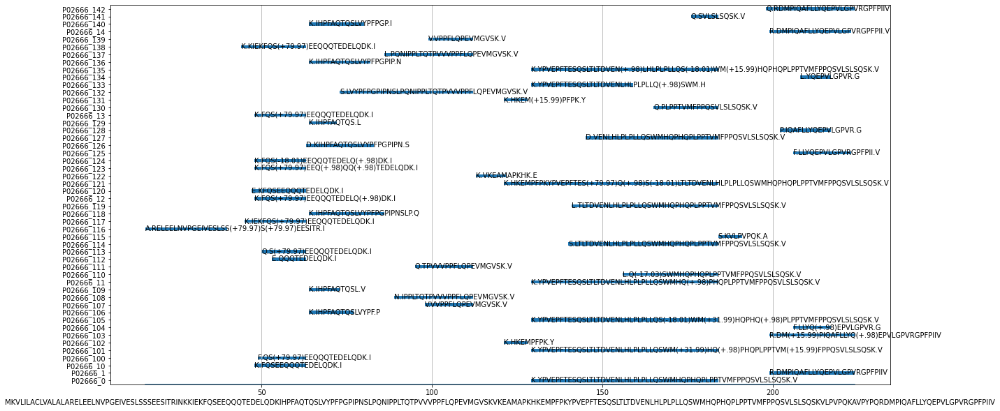

In [56]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from utils import get_protein_sequence
def plot_rect(data, delta=0.4):
    """data is a dictionary, {"Label":(low,hi), ... }
    return a drawing that you can manipulate, show, save etc"""
    print(type(data))
    yspan = len(data)
    yplaces = [.5+i for i in range(yspan)]
    ylabels = sorted(data.keys())

    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(111)
    ax.set_yticks(yplaces)
    ax.set_yticklabels(ylabels)
    ax.set_ylim((0,yspan))

    # later we'll need the min and max in the union of intervals
    low, hi, _=  data[ylabels[0]][0]
    for pos, label in zip(yplaces,ylabels):
        start, end, peptide = data[label][0]
        ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start,delta))
        #annotate the rectangle with label inside
        ax.text(start, pos, peptide, ha='left', va='center')
        if start<low : low=start
        if end>hi : hi=end

    # little small trick, draw an invisible line so that the x axis
    # limits are automatically adjusted...
    ax.plot((low,hi),(0,0))

    # now get the limits as automatically computed
    #xmin, xmax = ax.get_xlim()
    # and use them to draw the hlines in your example
    #ax.hlines(range(1,yspan),xmin,xmax)
    # the vlines are simply the x grid lines
    ax.grid(axis='x')
    # eventually return what we have done
    return ax


start_end_df = df[["Start", "End", "Protein Accession", "Peptide"]]
#only look at values for protein : P02666
start_end_df = start_end_df[start_end_df["Protein Accession"] == "P02666"]
start_end_df.sort_values('Start', inplace=True)
start_end_df['index1'] = start_end_df.index
#concat index1 and protein accession
start_end_df['Protein_Accession_idx'] = start_end_df['Protein Accession'] +"_" + start_end_df['index1'].astype(str) 
start_end_df["(start,end,peptide)"] = start_end_df[["Start", "End", "Peptide"]].apply(tuple, axis=1)
start_end_df.drop(["Start", "End", "index1"], axis=1, inplace=True)
start_end_df.sort_values('Protein_Accession_idx', inplace=True)
new = start_end_df.head(50)
# make dictionary with index as keys and (Start,End) as values
data = new.groupby("Protein_Accession_idx").apply(lambda x: x["(start,end,peptide)"].tolist())
data
# call the function and give its result a name
plt.figure(figsize=(20,10))
ax1 = plot_rect(data)
# so that we can further manipulate it using the `axes` methods, e.g.
seqq = get_protein_sequence("P02666")
ax1.set_xlabel(seqq)
# finally save or show what we have
plt.show()

<class 'pandas.core.series.Series'>


<Figure size 2160x720 with 0 Axes>

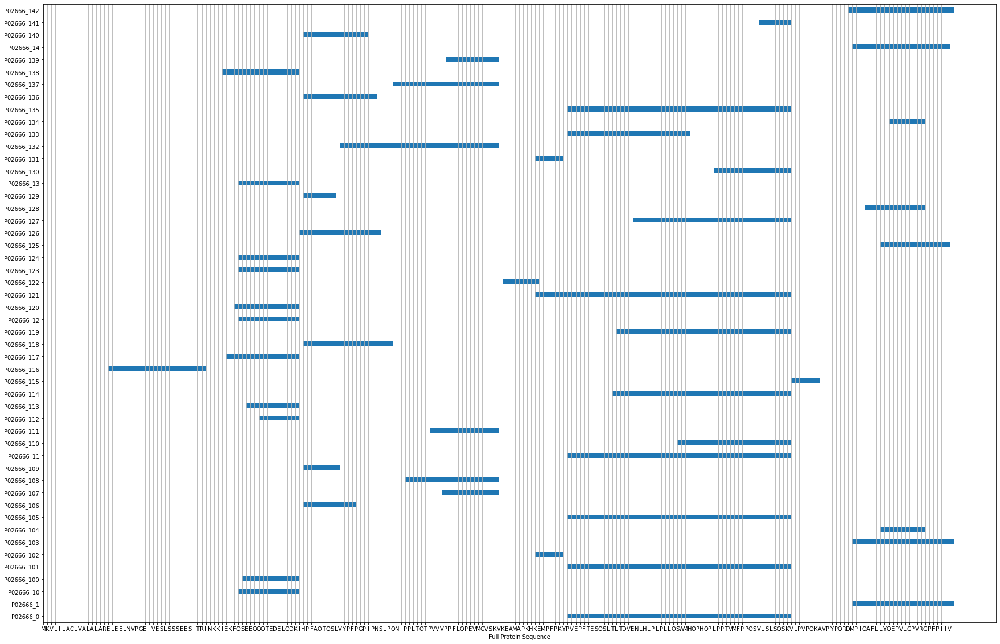

In [64]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from utils import get_protein_sequence
def plot_rect(data, delta=0.5):
    """data is a dictionary, {"Label":(low,hi), ... }
    return a drawing that you can manipulate, show, save etc"""
    print(type(data))
    yspan = len(data)
    yplaces = [.5+i for i in range(yspan)]
    ylabels = sorted(data.keys())

    fig = plt.figure(figsize=(30,20))
    ax = fig.add_subplot(111)
    ax.set_yticks(yplaces)
    ax.set_yticklabels(ylabels)
    ax.set_ylim((0,yspan))

    # later we'll need the min and max in the union of intervals
    low, hi, _=  data[ylabels[0]][0]
    for pos, label in zip(yplaces,ylabels):
        start, end, peptide = data[label][0]
        ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start,delta))
        #annotate the rectangle with label inside
        if start<low : low=start
        if end>hi : hi=end

    # little small trick, draw an invisible line so that the x axis
    # limits are automatically adjusted...
    ax.plot((low,hi),(0,0))
    ax.grid(axis='x')
    # eventually return what we have done
    return ax

# this is the main script, note that we have imported pyplot as plt
start_end_df = df[["Start", "End", "Protein Accession", "Peptide"]]
#only look at values for protein : P02666
start_end_df = start_end_df[start_end_df["Protein Accession"] == "P02666"]
start_end_df.sort_values('Start', inplace=True)
start_end_df['index1'] = start_end_df.index
#concat index1 and protein accession
start_end_df['Protein_Accession_idx'] = start_end_df['Protein Accession'] +"_" + start_end_df['index1'].astype(str) 
start_end_df["(start,end,peptide)"] = start_end_df[["Start", "End", "Peptide"]].apply(tuple, axis=1)
start_end_df.drop(["Start", "End", "index1"], axis=1, inplace=True)
start_end_df.sort_values('Protein_Accession_idx', inplace=True)
new = start_end_df.head(50)
# make dictionary with index as keys and (Start,End) as values
data = new.groupby("Protein_Accession_idx").apply(lambda x: x["(start,end,peptide)"].tolist())
data
# call the function and give its result a name
plt.figure(figsize=(30,10))
ax1 = plot_rect(data)
# so that we can further manipulate it using the `axes` methods, e.g.
seqq = get_protein_sequence("P02666")
ax1.set_xlabel("Full Protein Sequence")
ax1.set_xticks(range(0,len(seqq)))
# create list of chars from string 
seqq_list = list(seqq)
ax1.set_xticklabels(seqq_list)
# finally save or show what we have
plt.show()

<class 'pandas.core.series.Series'>


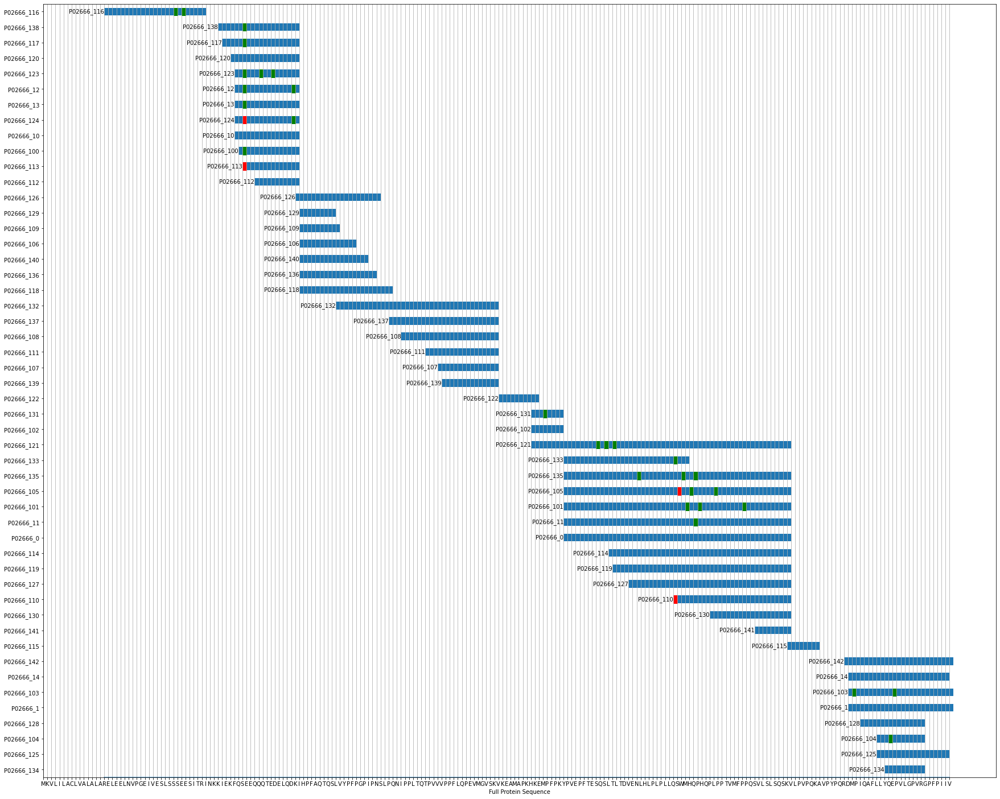

In [117]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from utils import get_protein_sequence
import re

# indicies have sign in front
def get_position_of_mass_shift_and_sign(input_string):
    # get charachters after and before mass shift
    ls = input_string.split('(')
    if len(ls) == 0:
        return np.nan
    #replace everythting witthin parenthesis with "#"
    modified_string = re.sub(r"\([^()]*\)", "#", input_string)
    modified_string = modified_string[2:-2] #remove first and last splice sites
    #get indices of "#"
    indices = [m.start()-1 for m in re.finditer("#", modified_string)]
    # add sign value in front of every index determined by value in ls 
    counter = 0
    for idx in indices:
        if input_string[idx+4] == '-' : #4 is 2 removed indices and + for the "(" and the sign
            indices[counter] = -indices[counter]
        counter += 1
    return indices 


# get position of mass shift in "peptide" for each row
df["Position of Mass Shift"] = df["Peptide"].apply(get_position_of_mass_shift_and_sign)
#df["mass_shift_pos"] = df.apply(get_position_of_mass_shift)
def plot_rect(data, delta=0.5):
    """data is a dictionary, {"Label":(low,hi), ... }
    return a drawing that you can manipulate, show, save etc"""
    print(type(data))
    yspan = len(data)
    yplaces = [.5+i for i in range(yspan)]
    #sort map by values, lowest first

    ylabels = sorted(data.keys(), key=lambda x: data[x][0], reverse=True)

    fig = plt.figure(figsize=(30,25))
    ax = fig.add_subplot(111)
    ax.set_yticks(yplaces)
    ax.set_yticklabels(ylabels)
    ax.set_ylim((0,yspan))

    # later we'll need the min and max in the union of intervals
    low, hi, _, ms_pos=  data[ylabels[0]][0]
    for pos, label in zip(yplaces,ylabels):
        start, end, peptide, ms_pos = data[label][0]
        start, end = start-1, end-1
        ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start+1,delta))
        ax.text(start, pos, label, ha='right', va='center')
        for _ms in ms_pos:
            if _ms > 0:
                ax.add_patch(patches.Rectangle((start+_ms,pos-delta/2.0),1,delta, color="green"))
            else:
                _ms = (-1)*_ms
                ax.add_patch(patches.Rectangle((start+_ms,pos-delta/2.0),1,delta, color="red"))
        #annotate the rectangle with label inside
        if start<low : low=start
        if end>hi : hi=end

    # little small trick, draw an invisible line so that the x axis
    # limits are automatically adjusted...
    ax.plot((low,hi),(0,0))
    ax.grid(axis='x')
    # eventually return what we have done
    return ax

# get position of mass shift in "peptide" for each row
df["Position of Mass Shift"] = df["Peptide"].apply(get_position_of_mass_shift_and_sign)
# this is the main script, note that we have imported pyplot as plt
start_end_df = df[["Start", "End", "Protein Accession", "Peptide", 'Position of Mass Shift']]
#only look at values for protein : P02666
start_end_df = start_end_df[start_end_df["Protein Accession"] == "P02666"]
start_end_df.sort_values('Start', inplace=True)
start_end_df['index1'] = start_end_df.index
#concat index1 and protein accession
start_end_df['Protein_Accession_idx'] = start_end_df['Protein Accession'] +"_" + start_end_df['index1'].astype(str) 
start_end_df["(start,end,peptide,pos_ms)"] = start_end_df[["Start", "End", "Peptide",'Position of Mass Shift']].apply(tuple, axis=1)
start_end_df.drop(["Start", "End", "index1"], axis=1, inplace=True)
start_end_df.sort_values('Protein_Accession_idx', inplace=True)
new = start_end_df.head(50)
# make dictionary with index as keys and (Start,End) as values
data = new.groupby("Protein_Accession_idx").apply(lambda x: x["(start,end,peptide,pos_ms)"].tolist())

# call the function and give its result a name
ax1 = plot_rect(data)
# so that we can further manipulate it using the `axes` methods, e.g.
seqq = get_protein_sequence("P02666")
ax1.set_xlabel("Full Protein Sequence")
ax1.set_xticks(range(0,len(seqq)))
# create list of chars from string 
seqq_list = list(seqq)
ax1.set_xticklabels(seqq_list)
#rotate x-axis labels
# finally save or show what we have
plt.show()

In [99]:
# find wor where protein accession idx is P02666_144
df[df['Peptide'] == "R.DMPIQAFLLYQEPVLGPVRGPFPIIV"]

,Protein Group,Protein Accession,Peptide,-10lgP,Mass,Length,ppm,z,RT,Area Sample 1,...,#Feature Sample 2,#Feature Sample 3,#Feature Sample 4,Start,End,PTM,AScore,#modifications,Position_of_mass_shift,Position of Mass Shift
1,3,P02666,R.DMPIQAFLLYQEPVLGPVRGPFPIIV,75.16,2908.5923,26,-2.9,2,87.68,40392000.0,...,4,2,3,199,224,NaN,NaN,0,"([], [R.DMPIQAFLLYQEPVLGPVRGPFPIIV], [])",[]


In [115]:
start_end_df[start_end_df['Protein_Accession_idx'] == "P02666_110"]


,Protein Accession,Peptide,Position of Mass Shift,Protein_Accession_idx,"(start,end,peptide,pos_ms)"
110,P02666,L.Q(-17.03)SWMHQPHQPLPPTVMFPPQSVLSLSQSK.V,[0],P02666_110,"(156, 184, L.Q(-17.03)SWMHQPHQPLPPTVMFPPQSVLSL..."


dict_items([(50, 6), (159, 1), (162, 1), (173, 1), (200, 1), (210, 1), (209, 1), (160, 1), (166, 1), (161, 2), (33, 1), (35, 1), (62, 2), (137, 1), (139, 1), (141, 1), (54, 1), (57, 1), (124, 1), (156, 1), (147, 1), (158, 1)])
dict_items([(-157, 1), (-156, 1), (-50, 2)])


<BarContainer object of 224 artists>

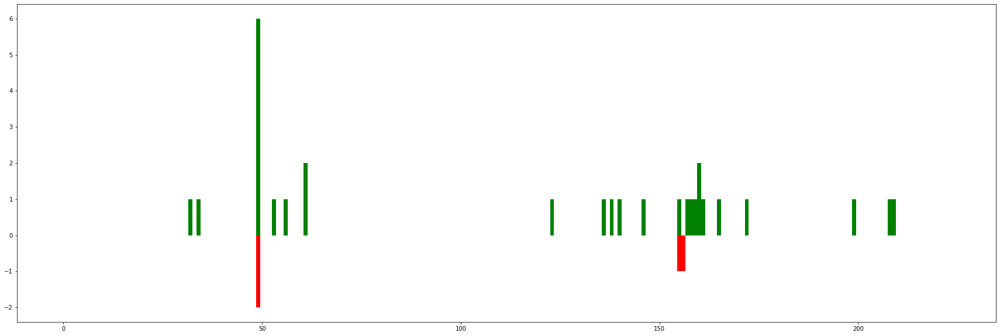

In [171]:
from collections import Counter
small_df = start_end_df.head(50)
x = range(len(seqq_list))

ll = small_df['Position of Mass Shift'].to_list()
# add column with mass shift position + value in "start" column
for i in range(len(ll)):
    if ll[i] != np.nan:
        tmp_list = []
        for j in ll[i]:
            if j > 0:
                tmp_list.append(j + small_df['(start,end,peptide,pos_ms)'].iloc[i][0])
            else:                
                tmp_list.append(j - small_df['(start,end,peptide,pos_ms)'].iloc[i][0])
        ll[i] = tmp_list

ll = [x for x in ll if x != []] #delete rows with empty lists
ll = [item for sublist in ll for item in sublist] #flatten list
negative_ll = [x for x in ll if x < 0]
positive_ll = [x for x in ll if x > 0]
# make lists with counts of positive mass shifts
positive_ll_count = Counter(positive_ll).items()
negative_ll_count = Counter(negative_ll).items()

# make list of zeroes
full_pos_list  = [0]*len(seqq_list)
full_neg_list  = [0]*len(seqq_list)
# add counts to list
for pos, count in positive_ll_count:
    full_pos_list[pos-1] = count
for pos, count in negative_ll_count:
    full_neg_list[-1*pos-1] = -count

fig = plt.figure(figsize=(30,10))
ax = plt.subplot(111)
ax.bar(x, full_pos_list, width=1, color='g')
ax.bar(x, full_neg_list, width=1, color='r')


In [172]:
#add heatmap and barchart to the same plot
# https://stackoverflow.com/questions/54788526/add-bar-plot-along-a-particular-axis-of-clustermap-with-index-specific-data 
#https://seaborn.pydata.org/examples/joint_histogram.html
# inspiration https://dash.gallery/dash-alignment-chart/demos/

In [ ]:


start_end_df = df[["Start", "End", "Protein Accession", "Peptide", 'Position of Mass Shift']]
#only look at values for protein : P02666
start_end_df = start_end_df[start_end_df["Protein Accession"] == "P02666"]
start_end_df.sort_values('Start', inplace=True)
start_end_df['index1'] = start_end_df.index
#concat index1 and protein accession
start_end_df['Protein_Accession_idx'] = start_end_df['Protein Accession'] +"_" + start_end_df['index1'].astype(str) 
start_end_df["(start,end,peptide,pos_ms)"] = start_end_df[["Start", "End", "Peptide",'Position of Mass Shift']].apply(tuple, axis=1)
start_end_df.drop(["Start", "End", "index1"], axis=1, inplace=True)
start_end_df.sort_values('Protein_Accession_idx', inplace=True)
new = start_end_df.head(50)
# make dictionary with index as keys and (Start,End) as values
data = new.groupby("Protein_Accession_idx").apply(lambda x: x["(start,end,peptide,pos_ms)"].tolist())


Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


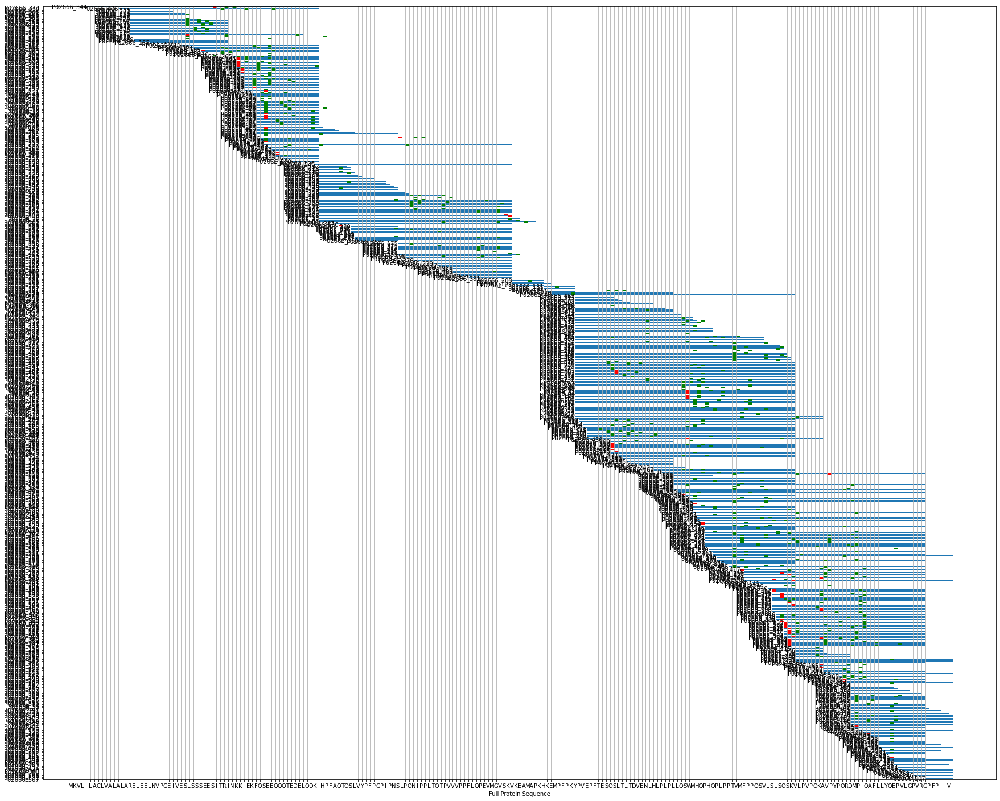

<AxesSubplot:xlabel='Full Protein Sequence'>

In [3]:
from utils import preprocess_data_for_peptide_segment_plot, plot_peptide_segments_and_mass_shift
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from utils import get_data_and_remove_unwanted_columns, sanitize_data
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)

df = preprocess_data_for_peptide_segment_plot(df, size=500)
plot_peptide_segments_and_mass_shift(df)

In [60]:
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
df[["PTM", "Area Sample 1"]].value_counts()

df1 = pd.DataFrame(df[["PTM", "Area Sample 1"]].value_counts())
df1 = df1.reset_index()
df1.columns = ['PTM', 'Area Sample 1', 'count']

#get number of unique ptm values
print(df1['PTM'].nunique())


df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
df2 = df[["Protein Accession","PTM", "Area Sample 1","Area Sample 2","Area Sample 3","Area Sample 4"]]
print(df2)
#remove values where PTM is nan
df2 = df2[df2["PTM"].notnull()]
# add all rows  where PTM are equal
df2 = df2.groupby(['PTM', "Protein Accession"]).sum()
# sort by Area sample
df2 = df2.sort_values(by=['Area Sample 1'], ascending=False)
df2



Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')
225
Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')
     Protein Accession                                          PTM  \
0               P02666                                          NaN   
1               P02666                                          NaN   
2               P02666 

Area Sample 1  \
PTM                                                Protein Accession                  
Phosphorylation (STY)                              P02662               587040564.0   
                                                   B5B3R8               586966309.0   
Deamidation (NQ)                                   P02662               581746043.6   
                                                   B5B3R8               558153582.6   
Carbamidomethylation                               P02754               476274131.0   
...                                                                             ...   
Lactosylation; Glycosylation type b; Phosphoryl... B5B3R8                       0.0   
Lactosylation; Glycosylation type b; lal           P02754                       0.0   
Lactosylation; Glycosylation type c/d              P02754                       0.0   
Lactosylation; Glycosylation type e; Deamidatio... P02754                       0.0   
Oxidation (M); Lactosylation; lal                  P02754                       0.0   

                                                                      Area Sample 2  \
PTM                                                Protein Accession                  
Phosphorylation (STY)                              P02662               564193397.0   
                                                   B5B3R8               564193397.0   
Deamidation (NQ)                                   P02662               585765577.0   
                                                   B5B3R8               577976976.0   
Carbamidomethylation                               P02754               229611639.0   
...                                                                             ...   
Lactosylation; Glycosylation type b; Phosphoryl... B5B3R8                       0.0   
Lactosylation; Glycosylation type b; lal           P02754                       0.0   
Lactosylation; Glycosylation type c/d              P02754                       0.0   
Lactosylation; Glycosylation type e; Deamidatio... P02754                       0.0   
Oxidation (M); Lactosylation; lal                  P02754                       0.0   

                                                                      Area Sample 3  \
PTM                                                Protein Accession                  
Phosphorylation (STY)                              P02662              5.122879e+08   
                                                   B5B3R8              5.122879e+08   
Deamidation (NQ)                                   P02662              1.221209e+09   
                                                   B5B3R8              1.166909e+09   
Carbamidomethylation                               P02754              3.946951e+08   
...                                                                             ...   
Lactosylation; Glycosylation type b; Phosphoryl... B5B3R8              0.000000e+00   
Lactosylation; Glycosylation type b; lal           P02754              0.000000e+00   
Lactosylation; Glycosylation type c/d              P02754              1.312700e+05   
Lactosylation; Glycosylation type e; Deamidatio... P02754              0.000000e+00   
Oxidation (M); Lactosylation; lal                  P02754              0.000000e+00   

                                                                      Area Sample 4  
PTM                                                Protein Accession                 
Phosphorylation (STY)                              P02662               588357046.0  
                                                   B5B3R8               588372311.0  
Deamidation (NQ)                                   P02662               552814897.2  
                                                   B5B3R8               542206643.2  
Carbamidomethylation                               P02754               294359455.0  
...                                                                     

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


Text(0.5, 1.0, 'Number of overlaps per position - for protein: P02666')

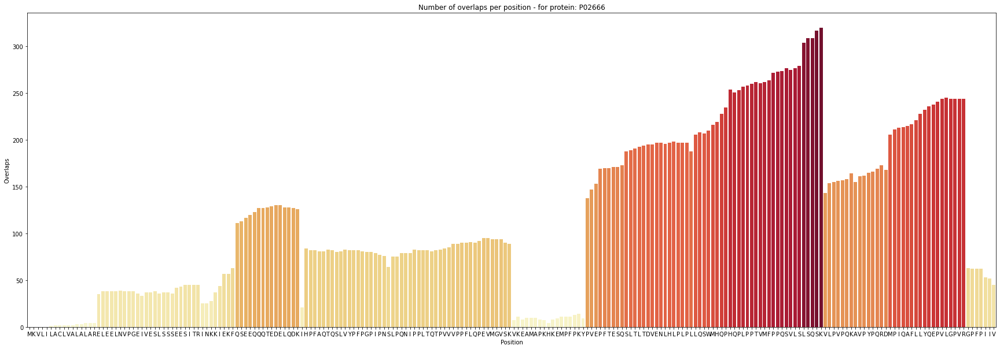

In [56]:
from utils import get_protein_sequence
import numpy as np

def colors_from_values(values, palette_name):
    # normalize the values to range [0, 1]
    normalized = (values - min(values)) / (max(values) - min(values))
    # convert to indices
    indices = np.round(normalized * (len(values) - 1)).astype(np.int32)
    # use the indices to get the colors
    palette = sns.color_palette(palette_name, len(values))
    return np.array(palette).take(indices, axis=0)

# make barchart with density of overlaps
# blot overlapping inttervals

# df where protein accession is P02666
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
def plot_overlap_barchart(df, selected_protein= "P02666"):
    df_new = df[df["Protein Accession"] == selected_protein]
    seq_list = list(get_protein_sequence(selected_protein))
    _len = len(seq_list)
    num_overlpas_list = [0]*_len # init as zeroes
    # add 1 into all positions where there is an overlap
    for i in range(len(df_new)):
        for j in range(df_new.iloc[i]['Start'], df_new.iloc[i]['End']):
            num_overlpas_list[j] += 1
    df_overlaps = pd.DataFrame(list(zip(range(_len), num_overlpas_list)), columns=['Position', 'Overlaps'])
    plt.figure(figsize=(30,10))
    g= sns.barplot(x="Position", y= "Overlaps", data= df_overlaps, palette=colors_from_values(np.asarray(num_overlpas_list), "YlOrRd"))
    g.set_xticklabels(seq_list)
    g.set_title(f"Number of overlaps per position - for protein: {selected_protein}")
    return g    

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


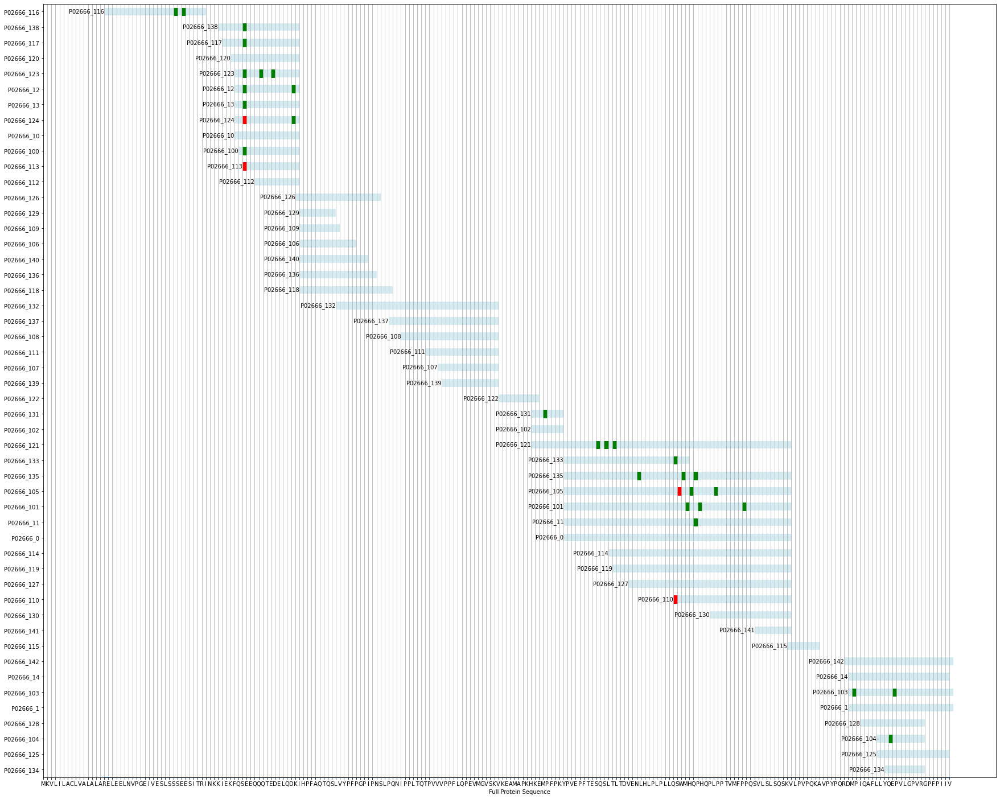

<AxesSubplot:xlabel='Full Protein Sequence'>

In [87]:
import matplotlib.patches as patches
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
df = preprocess_data_for_peptide_segment_plot(df, _protein="P02666", size=50)
plot_peptide_segments_and_mass_shift2(df)


Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


Text(0.5, 1.0, 'Pos/Negative Mass Shift Counts for Protein P02666')

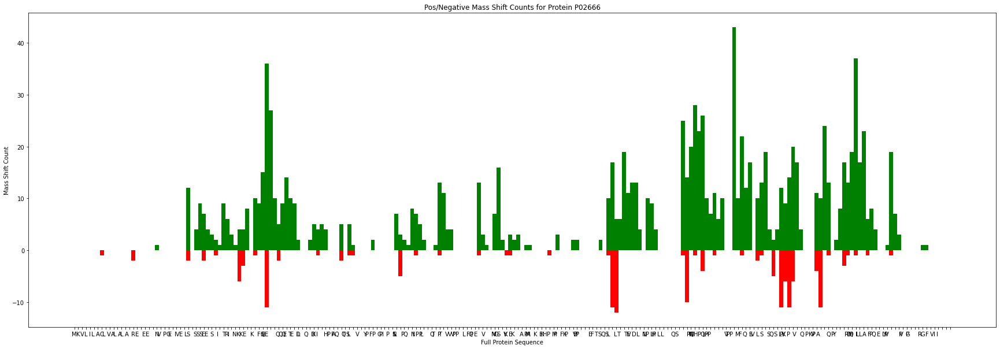

In [173]:
from collections import Counter
from utils import get_position_of_mass_shift_and_sign

df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
# get position of mass shift in "peptide" for each row
df["Position of Mass Shift"] = df["Peptide"].apply(get_position_of_mass_shift_and_sign)
# this is the main script, note that we have imported pyplot as plt
start_end_df = df[["Start", "End", "Protein Accession", "Peptide", 'Position of Mass Shift']]
#only look at values for protein : P02666
start_end_df = start_end_df[start_end_df["Protein Accession"] == "P02666"]
start_end_df.sort_values('Start', inplace=True)
start_end_df['index1'] = start_end_df.index
#concat index1 and protein accession
start_end_df['Protein_Accession_idx'] = start_end_df['Protein Accession'] +"_" + start_end_df['index1'].astype(str) 
start_end_df["(start,end,peptide,pos_ms)"] = start_end_df[["Start", "End", "Peptide",'Position of Mass Shift']].apply(tuple, axis=1)
start_end_df.drop(["Start", "End", "index1"], axis=1, inplace=True)
start_end_df.sort_values('Protein_Accession_idx', inplace=True)
# make dictionary with index as keys and (Start,End) as values
data = start_end_df.groupby("Protein_Accession_idx").apply(lambda x: x["(start,end,peptide,pos_ms)"].tolist())


small_df = start_end_df
x = seq_list

ll = small_df['Position of Mass Shift'].to_list()
# add column with mass shift position + value in "start" column
for i in range(len(ll)):
    if ll[i] != np.nan:
        tmp_list = []
        for j in ll[i]:
            if j > 0:
                tmp_list.append(j + small_df['(start,end,peptide,pos_ms)'].iloc[i][0])
            else:                
                tmp_list.append(j - small_df['(start,end,peptide,pos_ms)'].iloc[i][0])
        ll[i] = tmp_list

ll = [x for x in ll if x != []] #delete rows with empty lists
ll = [item for sublist in ll for item in sublist] #flatten list
negative_ll = [x for x in ll if x < 0]
positive_ll = [x for x in ll if x > 0]
# make lists with counts of positive mass shifts
positive_ll_count = Counter(positive_ll).items()
negative_ll_count = Counter(negative_ll).items()

# make list of zeroes
full_pos_list  = [0]*len(seq_list)
full_neg_list  = [0]*len(seq_list)
# add counts to list
for pos, count in positive_ll_count:
    full_pos_list[pos-1] = count
for pos, count in negative_ll_count:
    full_neg_list[-1*pos-1] = -count

fig = plt.figure(figsize=(30,10))
ax = plt.subplot(111)
ax.bar(x, full_pos_list, width=1, color='g')
ax.bar(x, full_neg_list, width=1, color='r')
plt.xlabel("Full Protein Sequence")
plt.ylabel("Mass Shift Count")
plt.title("Pos/Negative Mass Shift Counts for Protein P02666")

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


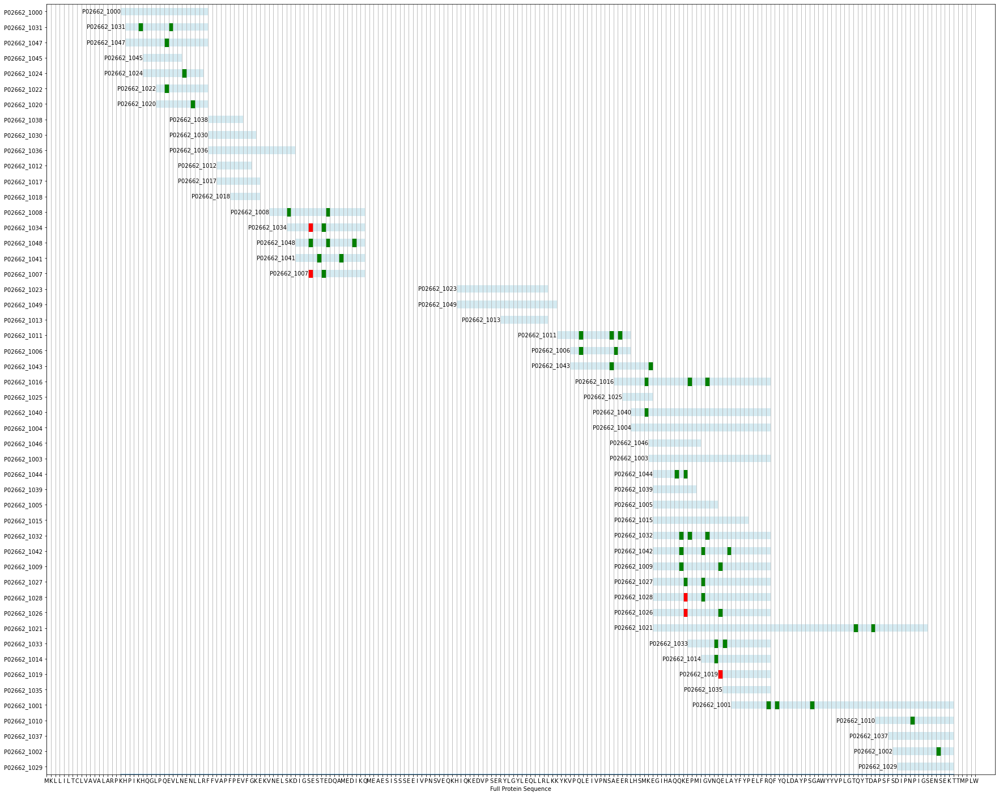

<AxesSubplot:xlabel='Full Protein Sequence'>

In [162]:
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
df = preprocess_data_for_peptide_segment_plot(df, _protein="P02662", size=50)
plot_peptide_segments_and_mass_shift2(df, _protein="P02662")

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


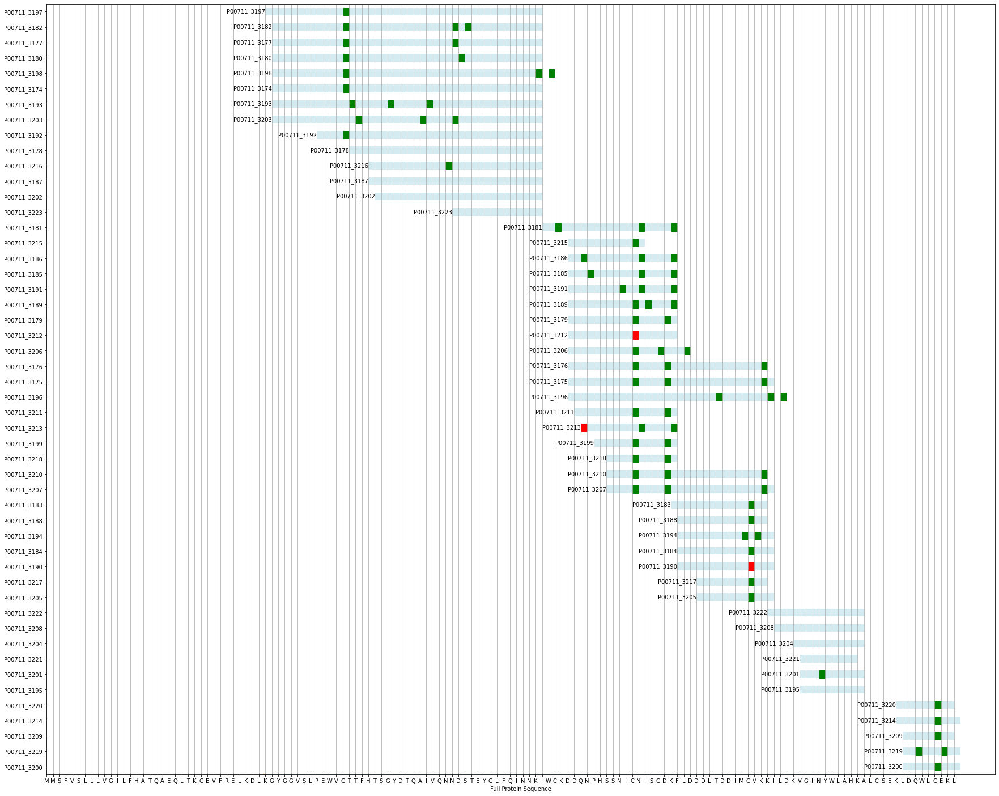

<AxesSubplot:xlabel='Full Protein Sequence'>

In [163]:
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
df = preprocess_data_for_peptide_segment_plot(df, _protein="P00711", size=50)
plot_peptide_segments_and_mass_shift2(df, _protein="P00711")

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


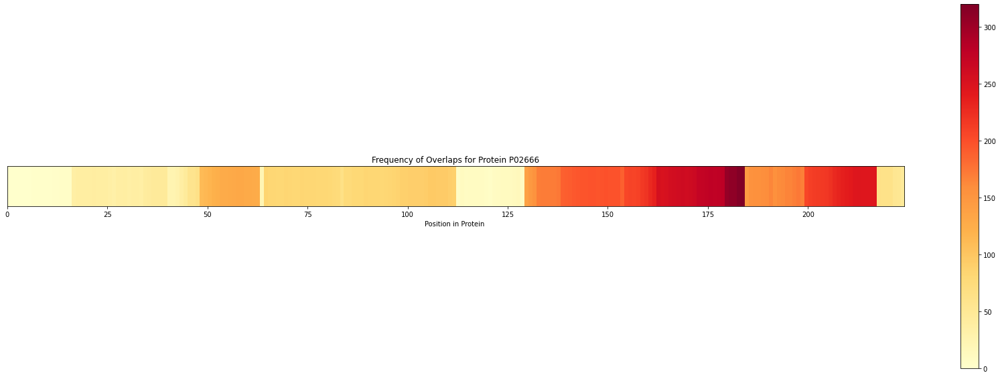

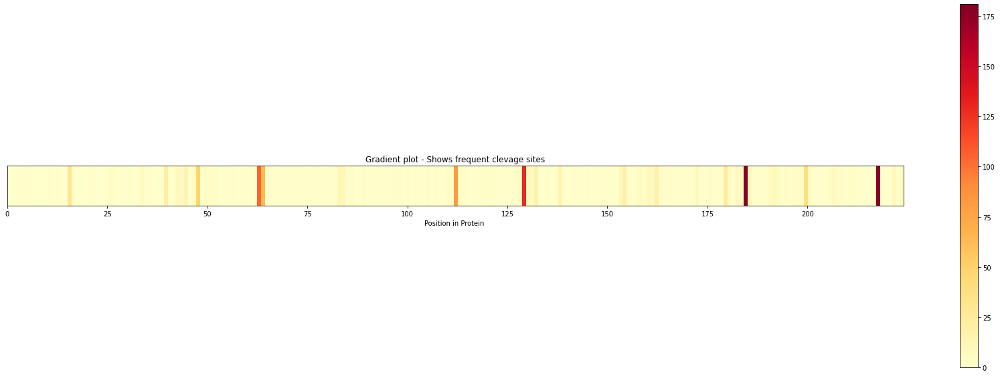

In [193]:
from utils import get_protein_sequence
import numpy as np

# df where protein accession is P02666
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
df_new = df[df["Protein Accession"] == "P02666"]
seq_list = list(get_protein_sequence("P02666"))
_len = len(seq_list)
num_overlpas_list = [0]*_len # init as zeroes
# add 1 into all positions where there is an overlap
for i in range(len(df_new)):
    for j in range(df_new.iloc[i]['Start'], df_new.iloc[i]['End']):
        num_overlpas_list[j] += 1
df_overlaps = pd.DataFrame(list(zip(range(_len), num_overlpas_list)), columns=['Position', 'Overlaps'])
plt.figure(figsize=(30,10))

plt.imshow(np.asarray(num_overlpas_list).reshape(1, -1), cmap='YlOrRd', extent=[0, _len, 0, 10])
plt.colorbar()
plt.title("Frequency of Overlaps for Protein P02666")
plt.xlabel("Position in Protein ")
plt.yticks([])

import scipy
from scipy import ndimage
# plot gradient
plt.figure(figsize=(30,10))
plt.title("Gradient plot - Shows frequent clevage sites")
plt.imshow(abs(np.diff(np.asarray(num_overlpas_list).reshape(1, -1)[::-1])), cmap='YlOrRd', extent=[0, _len, 0, 10])
plt.yticks([])
plt.colorbar()
plt.xlabel("Position in Protein ")
plt.show()

In [ ]:
# discretet colorscale
https://community.plotly.com/t/colors-for-discrete-ranges-in-heatmaps/7780/5

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')


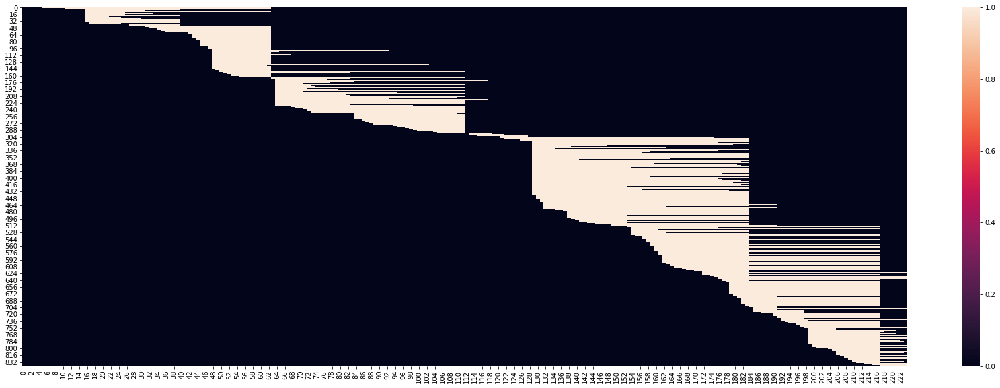

In [117]:
from utils import get_protein_sequence
import numpy as np

# df where protein accession is P02666
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
#sort by Start position
df = df.sort_values(by=['Start'])
df['one_hot_peptide_seq'] = [list() for x in range(len(df.index))]
df_new = df[df["Protein Accession"] == "P02666"]
seq_list = list(get_protein_sequence("P02666"))
_len = len(seq_list)
num_overlpas_list = [0]*_len # init as zeroes
# add 1 into all positions where there is an overlap

res = [[] for _ in range(len(df_new))]
for i in range(len(df_new)):
    zero_vec = np.zeros(len(seq_list))
    for j in range(df_new.iloc[i]['Start'], df_new.iloc[i]['End']):
        zero_vec[j]= 1
    # df_new.one_hot_peptide_seq.iloc[i] = zero_vec
    # append to the list to get list of lists
    res[i].append(zero_vec)

res = np.array(res).squeeze()
#plt.figure(figsize=(30,10))
sns.heatmap(res)

fig.show()

# df_overlaps = pd.DataFrame(list(zip(range(_len), num_overlpas_list)), columns=['Position', 'Overlaps'])
# plt.figure(figsize=(30,10))
# plt.imshow(np.asarray(num_overlpas_list).reshape(1, -1), cmap='YlOrRd', extent=[0, _len, 0, 10])
# plt.yticks([])

In [154]:
from utils import get_protein_sequence
import numpy as np
import plotly.graph_objects as go

def add_trailing_white_spaces_to_chars(seq_list):
    # equal to number of time char is seen in the sequence
    res_list = seq_list
    char_count_dict = {}
    counter = 0
    for char in seq_list:
        if char in char_count_dict:
            res_list[counter] = char + " "*char_count_dict[char]
            char_count_dict[char] += 1
        else:
            char_count_dict[char] = 1
        counter += 1
    return res_list

# df where protein accession is P02666
df = get_data_and_remove_unwanted_columns()
df = sanitize_data(df)
#sort by Start position
df = df.sort_values(by=['Start'])
df['one_hot_peptide_seq'] = [list() for x in range(len(df.index))]
df_new = df[df["Protein Accession"] == "P02666"]
seq_list = list(get_protein_sequence("P02666"))
_seq_list = add_trailing_white_spaces_to_chars(seq_list)
_len = len(seq_list)
num_overlpas_list = [0]*_len # init as zeroes
# add 1 into all positions where there is an overlap

res = [[] for _ in range(2*len(df_new))]
org_zero_vec = np.zeros(len(seq_list))

for i in range(len(df_new)):
    zero_vec = np.zeros(len(seq_list))
    for j in range(df_new.iloc[i]['Start'], df_new.iloc[i]['End']):
        zero_vec[j]= 1
    # df_new.one_hot_peptide_seq.iloc[i] = zero_vec
    # append to the list to get list of lists 
    res[i*2].append(zero_vec)
res = np.array(res).squeeze()

#plt.figure(figsize=(30,10))
#sns.heatmap(res)

import plotly.express as px
print(len(seq_list))
data= res 
print(data.shape)

fig = go.Figure(data=go.Heatmap(
        z=data,
        x=_seq_list,
        y=np.arange(2*len(df_new)),
        colorscale='Viridis'))

# fig = px.imshow(data,
#                 labels=dict(x="position", y="_", color="Productivity")
#                )
fig.update_layout(
    xaxis = dict(
        tickvals = np.arange(2*len(seq_list)),        
        ticktext = seq_list 
    ),
    width = 1400, height = 600,
    autosize = False
)
rev_list = np.arange(len(df_new))[::-1]
# fig.update_yaxes(autorange=False, range=rev_list)
# fig.update_xaxes(side="top")
fig.show()


# df_overlaps = pd.DataFrame(list(zip(range(_len), num_overlpas_list)), columns=['Position', 'Overlaps'])
# plt.figure(figsize=(30,10))
# plt.imshow(np.asarray(num_overlpas_list).reshape(1, -1), cmap='YlOrRd', extent=[0, _len, 0, 10])
# plt.yticks([])

Index(['Protein Group', 'Protein Accession', 'Peptide', '-10lgP', 'Mass',
       'Length', 'ppm', 'z', 'RT', 'Area Sample 1', 'Area Sample 2',
       'Area Sample 3', 'Area Sample 4', 'Fraction', '#Feature',
       '#Feature Sample 1', '#Feature Sample 2', '#Feature Sample 3',
       '#Feature Sample 4', 'Start', 'End', 'PTM', 'AScore', '#modifications'],
      dtype='object')
224
(1684, 224)
